# Update 02

## Violence non-violence detection YOLO-NAS_Modelv1

### Machine configuration

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!nvidia-smi

Wed Aug  2 07:55:39 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Installing YoloNAS

In [ ]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 58.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 81.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 100.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 101.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 108.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ...

In [ ]:
!pip install pytube
!pip show imutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.6 MB/s eta 0:00:00
Name: imutils
Version: 0.5.4
Summary: A series of convenience functions to make basic image processing functions such as translation, rotation, resizing, skeletonization, displaying Matplotlib images, sorting contours, detecting edges, and much more easier with OpenCV and both Python 2.7 and Python 3.
Home-page: https://github.com/jrosebr1/imutils
Author: Adrian Rosebrock
Author-email: adrian@pyimagesearch.com
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: 


In [ ]:
import torch
torch.__version__

'2.0.1+cu118'

### Load model with pretrained weights

In [ ]:
from super_gradients.training import models

model = models.get("yolo_nas_s", pretrained_weights="coco")

[2023-08-02 07:56:28] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-08-02 07:56:35] INFO - utils.py - NumExpr defaulting to 2 threads.
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-08-02 07:56:40] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-08-02 07:56:40] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-08-02 07:56:40] WARNING - export.py - Failed to import pytorch_quantization
[2023-08-02 07:56:40] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-08-02 07:56:40] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2023-08-02 07:56:40] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2023-08-02 07:56:40] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-08-02 07:56:40] WARNING

### Testing the pretrained model

[2023-08-02 07:57:57] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


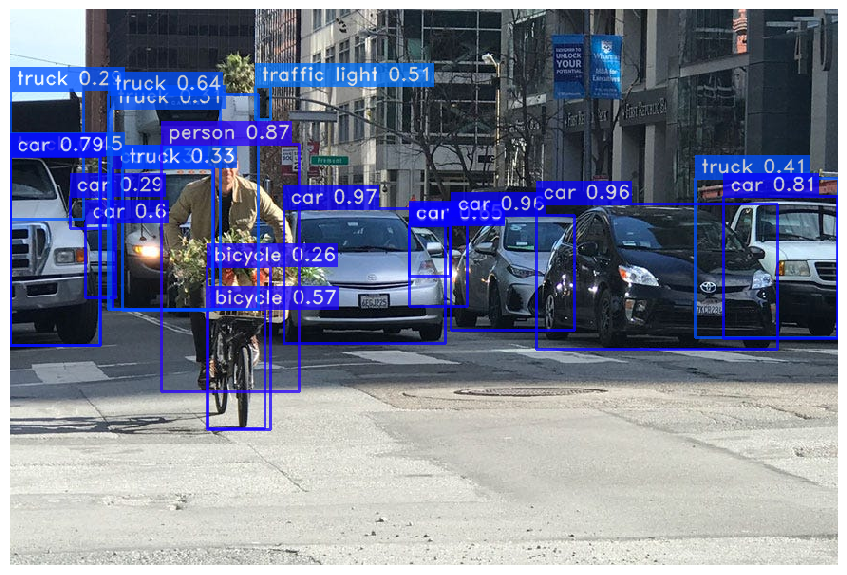

In [ ]:
url = "https://miro.medium.com/v2/resize:fit:1400/1*EYFejGUjvjPcc4PZTwoufw.jpeg"
model.predict(url, conf=0.25).show()

### importing trainer for custom dataset training

In [ ]:
from super_gradients.training import Trainer

CHECKPOINT_DIR = '/content/drive/MyDrive/thesis/checkpoints'
trainer = Trainer(experiment_name='violence_nonViolence_yolonas', ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

In [ ]:
dataset_params = {
    'data_dir':'/content/drive/MyDrive/thesis/dataset/roboflow',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['NonViolence', 'Violence']
}

### Custom dataset training

In [ ]:
#from IPython.display import clear_output

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

#clear_output()

Caching annotations: 100%|█████████▉| 289/290 [01:03<00:00,  4.82it/s]

Caching annotations: 100%|██████████| 290/290 [01:03<00:00,  4.54it/s]


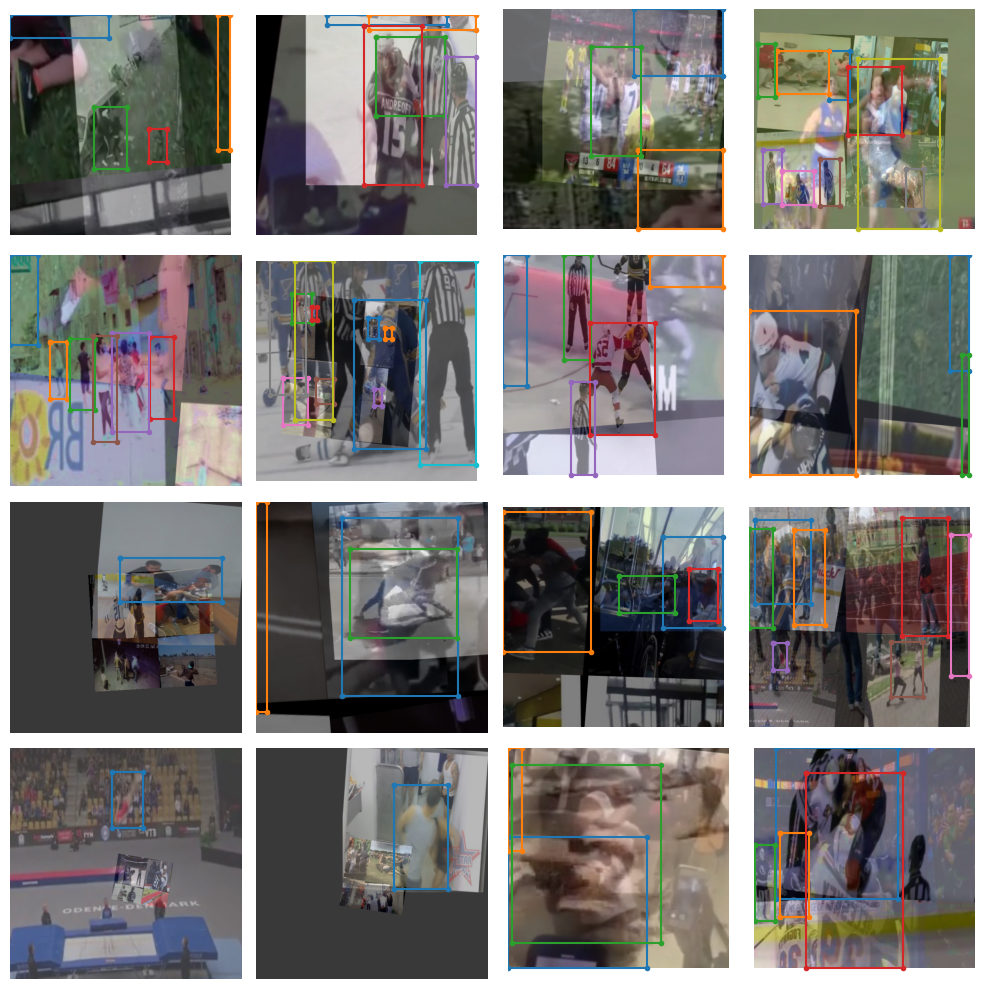

In [ ]:
train_data.dataset.plot()

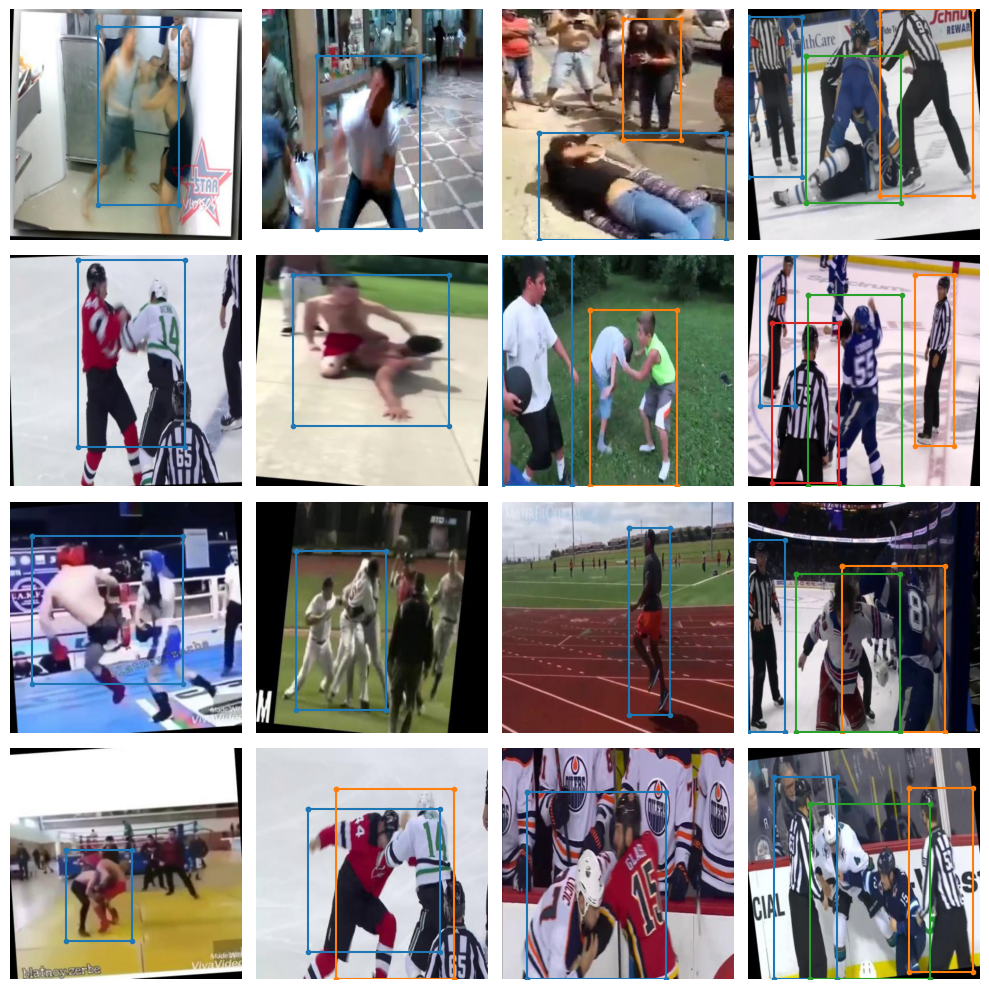

In [ ]:
val_data.dataset.plot()

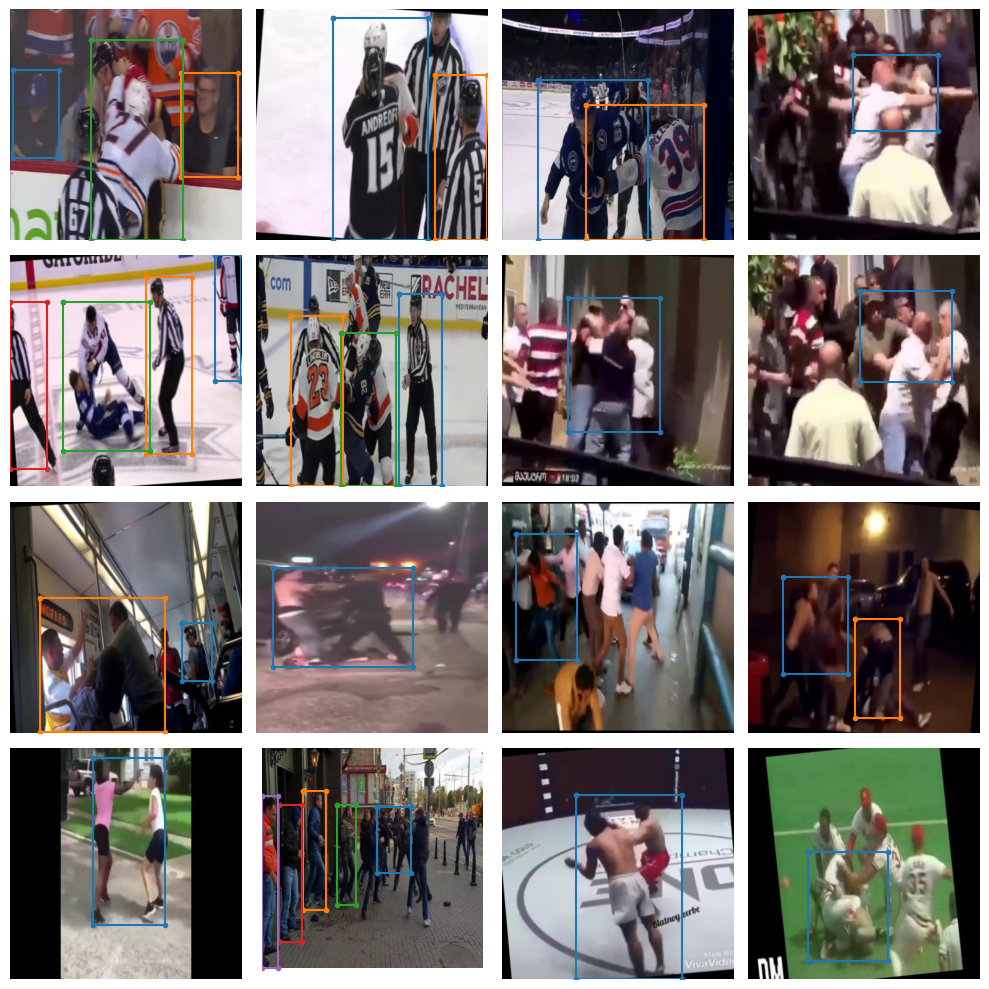

In [ ]:
test_data.dataset.plot()

In [ ]:
from super_gradients.training import models
model = models.get('yolo_nas_s',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2023-08-02 08:09:43] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 25,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas

<IPython.core.display.Javascript object>

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

The console stream is now moved to /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/console_Aug02_08_09_56.txt


[2023-08-02 08:09:57] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-08-02 08:10:00] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 1969       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         123        (len(train_loader))
    - Gradient updates per epoch:   123        (len(train_loader) / batch_accumulate)

[2023-08-02 08:10:00] INFO - sg_trainer.py - Started training for 25 epochs (0/24)

Validating: 100%|██████████| 36/36 [00:17<00:00,  2.03it/s]
[2023-08-02 08:13:15] INFO - base_sg_logger.py 

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.9265
│   ├── Ppyoloeloss/loss_iou = 0.3447
│   ├── Ppyoloeloss/loss_dfl = 1.885
│   └── Ppyoloeloss/loss = 3.7308
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.0403
    ├── Ppyoloeloss/loss_iou = 0.2743
    ├── Ppyoloeloss/loss_dfl = 1.6946
    ├── Ppyoloeloss/loss = 3.5734
    ├── Precision@0.50 = 0.0029
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0013
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
[2023-08-02 08:16:35] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:16:35] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.39293229579925537


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3065
│   │   ├── Epoch N-1      = 1.9265 (↘ -0.62)
│   │   └── Best until now = 1.9265 (↘ -0.62)
│   ├── Ppyoloeloss/loss_iou = 0.2609
│   │   ├── Epoch N-1      = 0.3447 (↘ -0.0838)
│   │   └── Best until now = 0.3447 (↘ -0.0838)
│   ├── Ppyoloeloss/loss_dfl = 1.5814
│   │   ├── Epoch N-1      = 1.885  (↘ -0.3035)
│   │   └── Best until now = 1.885  (↘ -0.3035)
│   └── Ppyoloeloss/loss = 2.7496
│       ├── Epoch N-1      = 3.7308 (↘ -0.9812)
│       └── Best until now = 3.7308 (↘ -0.9812)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3917
    │   ├── Epoch N-1      = 2.0403 (↘ -0.6486)
    │   └── Best until now = 2.0403 (↘ -0.6486)
    ├── Ppyoloeloss/loss_iou = 0.2133
    │   ├── Epoch N-1      = 0.2743 (↘ -0.061)
    │   └── Best until now = 0.2743 (↘ -0.061)
    ├── Ppyoloeloss/loss_dfl = 1.3855
    │   ├── Epoch N-1      = 1.6946 (↘ -0.3092)
    │   └── Best until now = 1.6946 (↘ -0.3092)
    ├── Ppyoloeloss/loss = 2

Validating epoch 2: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2558
│   │   ├── Epoch N-1      = 1.3065 (↘ -0.0508)
│   │   └── Best until now = 1.3065 (↘ -0.0508)
│   ├── Ppyoloeloss/loss_iou = 0.2404
│   │   ├── Epoch N-1      = 0.2609 (↘ -0.0205)
│   │   └── Best until now = 0.2609 (↘ -0.0205)
│   ├── Ppyoloeloss/loss_dfl = 1.5063
│   │   ├── Epoch N-1      = 1.5814 (↘ -0.0751)
│   │   └── Best until now = 1.5814 (↘ -0.0751)
│   └── Ppyoloeloss/loss = 2.61
│       ├── Epoch N-1      = 2.7496 (↘ -0.1396)
│       └── Best until now = 2.7496 (↘ -0.1396)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3069
    │   ├── Epoch N-1      = 1.3917 (↘ -0.0848)
    │   └── Best until now = 1.3917 (↘ -0.0848)
    ├── Ppyoloeloss/loss_iou = 0.2262
    │   ├── Epoch N-1      = 0.2133 (↗ 0.0129)
    │   └── Best until now = 0.2133 (↗ 0.0129)
    ├── Ppyoloeloss/loss_dfl = 1.4915
    │   ├── Epoch N-1      = 1.3855 (↗ 0.106)
    │   └── Best until now = 1.3855 (↗ 0.106)
    ├── Ppyoloeloss/loss = 2.6

Validating epoch 3: 100%|██████████| 36/36 [00:15<00:00,  2.37it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2556
│   │   ├── Epoch N-1      = 1.2558 (↘ -0.0002)
│   │   └── Best until now = 1.2558 (↘ -0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.2394
│   │   ├── Epoch N-1      = 0.2404 (↘ -0.001)
│   │   └── Best until now = 0.2404 (↘ -0.001)
│   ├── Ppyoloeloss/loss_dfl = 1.5055
│   │   ├── Epoch N-1      = 1.5063 (↘ -0.0008)
│   │   └── Best until now = 1.5063 (↘ -0.0008)
│   └── Ppyoloeloss/loss = 2.607
│       ├── Epoch N-1      = 2.61   (↘ -0.003)
│       └── Best until now = 2.61   (↘ -0.003)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2956
    │   ├── Epoch N-1      = 1.3069 (↘ -0.0114)
    │   └── Best until now = 1.3069 (↘ -0.0114)
    ├── Ppyoloeloss/loss_iou = 0.2261
    │   ├── Epoch N-1      = 0.2262 (↘ -1e-04)
    │   └── Best until now = 0.2133 (↗ 0.0128)
    ├── Ppyoloeloss/loss_dfl = 1.4837
    │   ├── Epoch N-1      = 1.4915 (↘ -0.0078)
    │   └── Best until now = 1.3855 (↗ 0.0983)
    ├── Ppyoloeloss/loss = 2.6

Validating epoch 4: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
[2023-08-02 08:25:17] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:25:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.4572986364364624


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2477
│   │   ├── Epoch N-1      = 1.2556 (↘ -0.0079)
│   │   └── Best until now = 1.2556 (↘ -0.0079)
│   ├── Ppyoloeloss/loss_iou = 0.232
│   │   ├── Epoch N-1      = 0.2394 (↘ -0.0075)
│   │   └── Best until now = 0.2394 (↘ -0.0075)
│   ├── Ppyoloeloss/loss_dfl = 1.4746
│   │   ├── Epoch N-1      = 1.5055 (↘ -0.0309)
│   │   └── Best until now = 1.5055 (↘ -0.0309)
│   └── Ppyoloeloss/loss = 2.5649
│       ├── Epoch N-1      = 2.607  (↘ -0.042)
│       └── Best until now = 2.607  (↘ -0.042)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3013
    │   ├── Epoch N-1      = 1.2956 (↗ 0.0057)
    │   └── Best until now = 1.2956 (↗ 0.0057)
    ├── Ppyoloeloss/loss_iou = 0.203
    │   ├── Epoch N-1      = 0.2261 (↘ -0.023)
    │   └── Best until now = 0.2133 (↘ -0.0103)
    ├── Ppyoloeloss/loss_dfl = 1.4029
    │   ├── Epoch N-1      = 1.4837 (↘ -0.0809)
    │   └── Best until now = 1.3855 (↗ 0.0174)
    ├── Ppyoloeloss/loss = 2.5

Validating epoch 5: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.246
│   │   ├── Epoch N-1      = 1.2477 (↘ -0.0016)
│   │   └── Best until now = 1.2477 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_iou = 0.2209
│   │   ├── Epoch N-1      = 0.232  (↘ -0.0111)
│   │   └── Best until now = 0.232  (↘ -0.0111)
│   ├── Ppyoloeloss/loss_dfl = 1.4398
│   │   ├── Epoch N-1      = 1.4746 (↘ -0.0348)
│   │   └── Best until now = 1.4746 (↘ -0.0348)
│   └── Ppyoloeloss/loss = 2.5181
│       ├── Epoch N-1      = 2.5649 (↘ -0.0468)
│       └── Best until now = 2.5649 (↘ -0.0468)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3771
    │   ├── Epoch N-1      = 1.3013 (↗ 0.0757)
    │   └── Best until now = 1.2956 (↗ 0.0815)
    ├── Ppyoloeloss/loss_iou = 0.1978
    │   ├── Epoch N-1      = 0.203  (↘ -0.0053)
    │   └── Best until now = 0.203  (↘ -0.0053)
    ├── Ppyoloeloss/loss_dfl = 1.3788
    │   ├── Epoch N-1      = 1.4029 (↘ -0.024)
    │   └── Best until now = 1.3855 (↘ -0.0066)
    ├── Ppyoloeloss/loss =

Validating epoch 6: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
[2023-08-02 08:31:04] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:31:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5311424732208252


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.224
│   │   ├── Epoch N-1      = 1.246  (↘ -0.0221)
│   │   └── Best until now = 1.246  (↘ -0.0221)
│   ├── Ppyoloeloss/loss_iou = 0.2164
│   │   ├── Epoch N-1      = 0.2209 (↘ -0.0045)
│   │   └── Best until now = 0.2209 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 1.4204
│   │   ├── Epoch N-1      = 1.4398 (↘ -0.0194)
│   │   └── Best until now = 1.4398 (↘ -0.0194)
│   └── Ppyoloeloss/loss = 2.4752
│       ├── Epoch N-1      = 2.5181 (↘ -0.043)
│       └── Best until now = 2.5181 (↘ -0.043)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2158
    │   ├── Epoch N-1      = 1.3771 (↘ -0.1613)
    │   └── Best until now = 1.2956 (↘ -0.0798)
    ├── Ppyoloeloss/loss_iou = 0.1964
    │   ├── Epoch N-1      = 0.1978 (↘ -0.0014)
    │   └── Best until now = 0.1978 (↘ -0.0014)
    ├── Ppyoloeloss/loss_dfl = 1.3447
    │   ├── Epoch N-1      = 1.3788 (↘ -0.0341)
    │   └── Best until now = 1.3788 (↘ -0.0341)
    ├── Ppyoloeloss/loss 

Validating epoch 7: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2311
│   │   ├── Epoch N-1      = 1.224  (↗ 0.0071)
│   │   └── Best until now = 1.224  (↗ 0.0071)
│   ├── Ppyoloeloss/loss_iou = 0.2161
│   │   ├── Epoch N-1      = 0.2164 (↘ -0.0003)
│   │   └── Best until now = 0.2164 (↘ -0.0003)
│   ├── Ppyoloeloss/loss_dfl = 1.4237
│   │   ├── Epoch N-1      = 1.4204 (↗ 0.0033)
│   │   └── Best until now = 1.4204 (↗ 0.0033)
│   └── Ppyoloeloss/loss = 2.4832
│       ├── Epoch N-1      = 2.4752 (↗ 0.0081)
│       └── Best until now = 2.4752 (↗ 0.0081)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3622
    │   ├── Epoch N-1      = 1.2158 (↗ 0.1464)
    │   └── Best until now = 1.2158 (↗ 0.1464)
    ├── Ppyoloeloss/loss_iou = 0.1875
    │   ├── Epoch N-1      = 0.1964 (↘ -0.0088)
    │   └── Best until now = 0.1964 (↘ -0.0088)
    ├── Ppyoloeloss/loss_dfl = 1.3282
    │   ├── Epoch N-1      = 1.3447 (↘ -0.0165)
    │   └── Best until now = 1.3447 (↘ -0.0165)
    ├── Ppyoloeloss/loss = 2.4

Validating epoch 8: 100%|██████████| 36/36 [00:14<00:00,  2.46it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2163
│   │   ├── Epoch N-1      = 1.2311 (↘ -0.0148)
│   │   └── Best until now = 1.224  (↘ -0.0077)
│   ├── Ppyoloeloss/loss_iou = 0.2108
│   │   ├── Epoch N-1      = 0.2161 (↘ -0.0053)
│   │   └── Best until now = 0.2161 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_dfl = 1.3862
│   │   ├── Epoch N-1      = 1.4237 (↘ -0.0375)
│   │   └── Best until now = 1.4204 (↘ -0.0342)
│   └── Ppyoloeloss/loss = 2.4365
│       ├── Epoch N-1      = 2.4832 (↘ -0.0468)
│       └── Best until now = 2.4752 (↘ -0.0387)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3388
    │   ├── Epoch N-1      = 1.3622 (↘ -0.0235)
    │   └── Best until now = 1.2158 (↗ 0.1229)
    ├── Ppyoloeloss/loss_iou = 0.2031
    │   ├── Epoch N-1      = 0.1875 (↗ 0.0156)
    │   └── Best until now = 0.1875 (↗ 0.0156)
    ├── Ppyoloeloss/loss_dfl = 1.4072
    │   ├── Epoch N-1      = 1.3282 (↗ 0.079)
    │   └── Best until now = 1.3282 (↗ 0.079)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 9: 100%|██████████| 36/36 [00:13<00:00,  2.60it/s]
[2023-08-02 08:39:45] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:39:45] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.541743278503418


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2146
│   │   ├── Epoch N-1      = 1.2163 (↘ -0.0017)
│   │   └── Best until now = 1.2163 (↘ -0.0017)
│   ├── Ppyoloeloss/loss_iou = 0.211
│   │   ├── Epoch N-1      = 0.2108 (↗ 0.0002)
│   │   └── Best until now = 0.2108 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 1.3853
│   │   ├── Epoch N-1      = 1.3862 (↘ -0.0009)
│   │   └── Best until now = 1.3862 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 2.4348
│       ├── Epoch N-1      = 2.4365 (↘ -0.0017)
│       └── Best until now = 2.4365 (↘ -0.0017)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2425
    │   ├── Epoch N-1      = 1.3388 (↘ -0.0962)
    │   └── Best until now = 1.2158 (↗ 0.0267)
    ├── Ppyoloeloss/loss_iou = 0.1854
    │   ├── Epoch N-1      = 0.2031 (↘ -0.0177)
    │   └── Best until now = 0.1875 (↘ -0.0021)
    ├── Ppyoloeloss/loss_dfl = 1.2852
    │   ├── Epoch N-1      = 1.4072 (↘ -0.122)
    │   └── Best until now = 1.3282 (↘ -0.0431)
    ├── Ppyoloeloss/loss = 

Validating epoch 10: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
[2023-08-02 08:42:46] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:42:46] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.587774395942688


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.199
│   │   ├── Epoch N-1      = 1.2146 (↘ -0.0157)
│   │   └── Best until now = 1.2146 (↘ -0.0157)
│   ├── Ppyoloeloss/loss_iou = 0.2081
│   │   ├── Epoch N-1      = 0.211  (↘ -0.0029)
│   │   └── Best until now = 0.2108 (↘ -0.0027)
│   ├── Ppyoloeloss/loss_dfl = 1.3748
│   │   ├── Epoch N-1      = 1.3853 (↘ -0.0105)
│   │   └── Best until now = 1.3853 (↘ -0.0105)
│   └── Ppyoloeloss/loss = 2.4067
│       ├── Epoch N-1      = 2.4348 (↘ -0.0281)
│       └── Best until now = 2.4348 (↘ -0.0281)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2021
    │   ├── Epoch N-1      = 1.2425 (↘ -0.0404)
    │   └── Best until now = 1.2158 (↘ -0.0137)
    ├── Ppyoloeloss/loss_iou = 0.1868
    │   ├── Epoch N-1      = 0.1854 (↗ 0.0014)
    │   └── Best until now = 0.1854 (↗ 0.0014)
    ├── Ppyoloeloss/loss_dfl = 1.2841
    │   ├── Epoch N-1      = 1.2852 (↘ -0.0011)
    │   └── Best until now = 1.2852 (↘ -0.0011)
    ├── Ppyoloeloss/loss

Validating epoch 11: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
[2023-08-02 08:45:47] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:45:47] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6216937303543091


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1918
│   │   ├── Epoch N-1      = 1.199  (↘ -0.0072)
│   │   └── Best until now = 1.199  (↘ -0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.2049
│   │   ├── Epoch N-1      = 0.2081 (↘ -0.0032)
│   │   └── Best until now = 0.2081 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 1.3491
│   │   ├── Epoch N-1      = 1.3748 (↘ -0.0257)
│   │   └── Best until now = 1.3748 (↘ -0.0257)
│   └── Ppyoloeloss/loss = 2.3787
│       ├── Epoch N-1      = 2.4067 (↘ -0.028)
│       └── Best until now = 2.4067 (↘ -0.028)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2544
    │   ├── Epoch N-1      = 1.2021 (↗ 0.0523)
    │   └── Best until now = 1.2021 (↗ 0.0523)
    ├── Ppyoloeloss/loss_iou = 0.1778
    │   ├── Epoch N-1      = 0.1868 (↘ -0.009)
    │   └── Best until now = 0.1854 (↘ -0.0076)
    ├── Ppyoloeloss/loss_dfl = 1.2375
    │   ├── Epoch N-1      = 1.2841 (↘ -0.0466)
    │   └── Best until now = 1.2841 (↘ -0.0466)
    ├── Ppyoloeloss/loss =

Validating epoch 12: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
[2023-08-02 08:48:49] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 08:48:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6939370632171631


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1841
│   │   ├── Epoch N-1      = 1.1918 (↘ -0.0077)
│   │   └── Best until now = 1.1918 (↘ -0.0077)
│   ├── Ppyoloeloss/loss_iou = 0.2035
│   │   ├── Epoch N-1      = 0.2049 (↘ -0.0014)
│   │   └── Best until now = 0.2049 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 1.3367
│   │   ├── Epoch N-1      = 1.3491 (↘ -0.0123)
│   │   └── Best until now = 1.3491 (↘ -0.0123)
│   └── Ppyoloeloss/loss = 2.3612
│       ├── Epoch N-1      = 2.3787 (↘ -0.0175)
│       └── Best until now = 2.3787 (↘ -0.0175)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1798
    │   ├── Epoch N-1      = 1.2544 (↘ -0.0745)
    │   └── Best until now = 1.2021 (↘ -0.0223)
    ├── Ppyoloeloss/loss_iou = 0.1768
    │   ├── Epoch N-1      = 0.1778 (↘ -0.001)
    │   └── Best until now = 0.1778 (↘ -0.001)
    ├── Ppyoloeloss/loss_dfl = 1.2449
    │   ├── Epoch N-1      = 1.2375 (↗ 0.0074)
    │   └── Best until now = 1.2375 (↗ 0.0074)
    ├── Ppyoloeloss/loss 

Validating epoch 13: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1669
│   │   ├── Epoch N-1      = 1.1841 (↘ -0.0172)
│   │   └── Best until now = 1.1841 (↘ -0.0172)
│   ├── Ppyoloeloss/loss_iou = 0.201
│   │   ├── Epoch N-1      = 0.2035 (↘ -0.0025)
│   │   └── Best until now = 0.2035 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_dfl = 1.3292
│   │   ├── Epoch N-1      = 1.3367 (↘ -0.0076)
│   │   └── Best until now = 1.3367 (↘ -0.0076)
│   └── Ppyoloeloss/loss = 2.3338
│       ├── Epoch N-1      = 2.3612 (↘ -0.0274)
│       └── Best until now = 2.3612 (↘ -0.0274)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2157
    │   ├── Epoch N-1      = 1.1798 (↗ 0.0358)
    │   └── Best until now = 1.1798 (↗ 0.0358)
    ├── Ppyoloeloss/loss_iou = 0.1775
    │   ├── Epoch N-1      = 0.1768 (↗ 0.0007)
    │   └── Best until now = 0.1768 (↗ 0.0007)
    ├── Ppyoloeloss/loss_dfl = 1.2657
    │   ├── Epoch N-1      = 1.2449 (↗ 0.0208)
    │   └── Best until now = 1.2375 (↗ 0.0282)
    ├── Ppyoloeloss/loss = 2

Validating epoch 14: 100%|██████████| 36/36 [00:13<00:00,  2.60it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.154
│   │   ├── Epoch N-1      = 1.1669 (↘ -0.0129)
│   │   └── Best until now = 1.1669 (↘ -0.0129)
│   ├── Ppyoloeloss/loss_iou = 0.1992
│   │   ├── Epoch N-1      = 0.201  (↘ -0.0018)
│   │   └── Best until now = 0.201  (↘ -0.0018)
│   ├── Ppyoloeloss/loss_dfl = 1.3171
│   │   ├── Epoch N-1      = 1.3292 (↘ -0.012)
│   │   └── Best until now = 1.3292 (↘ -0.012)
│   └── Ppyoloeloss/loss = 2.3105
│       ├── Epoch N-1      = 2.3338 (↘ -0.0233)
│       └── Best until now = 2.3338 (↘ -0.0233)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1711
    │   ├── Epoch N-1      = 1.2157 (↘ -0.0445)
    │   └── Best until now = 1.1798 (↘ -0.0087)
    ├── Ppyoloeloss/loss_iou = 0.1761
    │   ├── Epoch N-1      = 0.1775 (↘ -0.0015)
    │   └── Best until now = 0.1768 (↘ -0.0008)
    ├── Ppyoloeloss/loss_dfl = 1.25
    │   ├── Epoch N-1      = 1.2657 (↘ -0.0157)
    │   └── Best until now = 1.2375 (↗ 0.0125)
    ├── Ppyoloeloss/loss = 

Validating epoch 15: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.153
│   │   ├── Epoch N-1      = 1.154  (↘ -0.001)
│   │   └── Best until now = 1.154  (↘ -0.001)
│   ├── Ppyoloeloss/loss_iou = 0.1974
│   │   ├── Epoch N-1      = 0.1992 (↘ -0.0018)
│   │   └── Best until now = 0.1992 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_dfl = 1.3138
│   │   ├── Epoch N-1      = 1.3171 (↘ -0.0034)
│   │   └── Best until now = 1.3171 (↘ -0.0034)
│   └── Ppyoloeloss/loss = 2.3033
│       ├── Epoch N-1      = 2.3105 (↘ -0.0072)
│       └── Best until now = 2.3105 (↘ -0.0072)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1377
    │   ├── Epoch N-1      = 1.1711 (↘ -0.0334)
    │   └── Best until now = 1.1711 (↘ -0.0334)
    ├── Ppyoloeloss/loss_iou = 0.1758
    │   ├── Epoch N-1      = 0.1761 (↘ -0.0002)
    │   └── Best until now = 0.1761 (↘ -0.0002)
    ├── Ppyoloeloss/loss_dfl = 1.2221
    │   ├── Epoch N-1      = 1.25   (↘ -0.0279)
    │   └── Best until now = 1.2375 (↘ -0.0154)
    ├── Ppyoloeloss/loss

Validating epoch 16: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
[2023-08-02 09:00:55] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:00:55] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7022527456283569


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.14
│   │   ├── Epoch N-1      = 1.153  (↘ -0.013)
│   │   └── Best until now = 1.153  (↘ -0.013)
│   ├── Ppyoloeloss/loss_iou = 0.1955
│   │   ├── Epoch N-1      = 0.1974 (↘ -0.0019)
│   │   └── Best until now = 0.1974 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.3023
│   │   ├── Epoch N-1      = 1.3138 (↘ -0.0114)
│   │   └── Best until now = 1.3138 (↘ -0.0114)
│   └── Ppyoloeloss/loss = 2.28
│       ├── Epoch N-1      = 2.3033 (↘ -0.0233)
│       └── Best until now = 2.3033 (↘ -0.0233)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0879
    │   ├── Epoch N-1      = 1.1377 (↘ -0.0498)
    │   └── Best until now = 1.1377 (↘ -0.0498)
    ├── Ppyoloeloss/loss_iou = 0.1737
    │   ├── Epoch N-1      = 0.1758 (↘ -0.0022)
    │   └── Best until now = 0.1758 (↘ -0.0022)
    ├── Ppyoloeloss/loss_dfl = 1.2102
    │   ├── Epoch N-1      = 1.2221 (↘ -0.0119)
    │   └── Best until now = 1.2221 (↘ -0.0119)
    ├── Ppyoloeloss/loss = 

Validating epoch 17: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
[2023-08-02 09:03:59] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:03:59] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7438738346099854


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1231
│   │   ├── Epoch N-1      = 1.14   (↘ -0.0169)
│   │   └── Best until now = 1.14   (↘ -0.0169)
│   ├── Ppyoloeloss/loss_iou = 0.19
│   │   ├── Epoch N-1      = 0.1955 (↘ -0.0055)
│   │   └── Best until now = 0.1955 (↘ -0.0055)
│   ├── Ppyoloeloss/loss_dfl = 1.2781
│   │   ├── Epoch N-1      = 1.3023 (↘ -0.0243)
│   │   └── Best until now = 1.3023 (↘ -0.0243)
│   └── Ppyoloeloss/loss = 2.2372
│       ├── Epoch N-1      = 2.28   (↘ -0.0428)
│       └── Best until now = 2.28   (↘ -0.0428)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1233
    │   ├── Epoch N-1      = 1.0879 (↗ 0.0354)
    │   └── Best until now = 1.0879 (↗ 0.0354)
    ├── Ppyoloeloss/loss_iou = 0.1745
    │   ├── Epoch N-1      = 0.1737 (↗ 0.0009)
    │   └── Best until now = 0.1737 (↗ 0.0009)
    ├── Ppyoloeloss/loss_dfl = 1.2158
    │   ├── Epoch N-1      = 1.2102 (↗ 0.0056)
    │   └── Best until now = 1.2102 (↗ 0.0056)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 18: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
[2023-08-02 09:06:56] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:06:56] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.759931206703186


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1129
│   │   ├── Epoch N-1      = 1.1231 (↘ -0.0103)
│   │   └── Best until now = 1.1231 (↘ -0.0103)
│   ├── Ppyoloeloss/loss_iou = 0.1884
│   │   ├── Epoch N-1      = 0.19   (↘ -0.0016)
│   │   └── Best until now = 0.19   (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 1.2676
│   │   ├── Epoch N-1      = 1.2781 (↘ -0.0105)
│   │   └── Best until now = 1.2781 (↘ -0.0105)
│   └── Ppyoloeloss/loss = 2.2177
│       ├── Epoch N-1      = 2.2372 (↘ -0.0195)
│       └── Best until now = 2.2372 (↘ -0.0195)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1324
    │   ├── Epoch N-1      = 1.1233 (↗ 0.0091)
    │   └── Best until now = 1.0879 (↗ 0.0445)
    ├── Ppyoloeloss/loss_iou = 0.1685
    │   ├── Epoch N-1      = 0.1745 (↘ -0.006)
    │   └── Best until now = 0.1737 (↘ -0.0051)
    ├── Ppyoloeloss/loss_dfl = 1.1849
    │   ├── Epoch N-1      = 1.2158 (↘ -0.0309)
    │   └── Best until now = 1.2102 (↘ -0.0253)
    ├── Ppyoloeloss/loss

Validating epoch 19: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
[2023-08-02 09:09:52] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:09:52] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7682194709777832


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1009
│   │   ├── Epoch N-1      = 1.1129 (↘ -0.0119)
│   │   └── Best until now = 1.1129 (↘ -0.0119)
│   ├── Ppyoloeloss/loss_iou = 0.1882
│   │   ├── Epoch N-1      = 0.1884 (↘ -0.0002)
│   │   └── Best until now = 0.1884 (↘ -0.0002)
│   ├── Ppyoloeloss/loss_dfl = 1.2605
│   │   ├── Epoch N-1      = 1.2676 (↘ -0.0071)
│   │   └── Best until now = 1.2676 (↘ -0.0071)
│   └── Ppyoloeloss/loss = 2.2016
│       ├── Epoch N-1      = 2.2177 (↘ -0.016)
│       └── Best until now = 2.2177 (↘ -0.016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0571
    │   ├── Epoch N-1      = 1.1324 (↘ -0.0752)
    │   └── Best until now = 1.0879 (↘ -0.0307)
    ├── Ppyoloeloss/loss_iou = 0.1698
    │   ├── Epoch N-1      = 0.1685 (↗ 0.0013)
    │   └── Best until now = 0.1685 (↗ 0.0013)
    ├── Ppyoloeloss/loss_dfl = 1.1908
    │   ├── Epoch N-1      = 1.1849 (↗ 0.0058)
    │   └── Best until now = 1.1849 (↗ 0.0058)
    ├── Ppyoloeloss/loss = 

Validating epoch 20: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
[2023-08-02 09:12:49] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:12:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7893977761268616


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0928
│   │   ├── Epoch N-1      = 1.1009 (↘ -0.0081)
│   │   └── Best until now = 1.1009 (↘ -0.0081)
│   ├── Ppyoloeloss/loss_iou = 0.1858
│   │   ├── Epoch N-1      = 0.1882 (↘ -0.0024)
│   │   └── Best until now = 0.1882 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_dfl = 1.2518
│   │   ├── Epoch N-1      = 1.2605 (↘ -0.0088)
│   │   └── Best until now = 1.2605 (↘ -0.0088)
│   └── Ppyoloeloss/loss = 2.1831
│       ├── Epoch N-1      = 2.2016 (↘ -0.0185)
│       └── Best until now = 2.2016 (↘ -0.0185)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0174
    │   ├── Epoch N-1      = 1.0571 (↘ -0.0398)
    │   └── Best until now = 1.0571 (↘ -0.0398)
    ├── Ppyoloeloss/loss_iou = 0.1694
    │   ├── Epoch N-1      = 0.1698 (↘ -0.0004)
    │   └── Best until now = 0.1685 (↗ 0.0009)
    ├── Ppyoloeloss/loss_dfl = 1.1855
    │   ├── Epoch N-1      = 1.1908 (↘ -0.0053)
    │   └── Best until now = 1.1849 (↗ 0.0006)
    ├── Ppyoloeloss/los

Validating epoch 21: 100%|██████████| 36/36 [00:13<00:00,  2.62it/s]
[2023-08-02 09:15:50] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:15:50] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.792677104473114


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0889
│   │   ├── Epoch N-1      = 1.0928 (↘ -0.0039)
│   │   └── Best until now = 1.0928 (↘ -0.0039)
│   ├── Ppyoloeloss/loss_iou = 0.1864
│   │   ├── Epoch N-1      = 0.1858 (↗ 0.0006)
│   │   └── Best until now = 0.1858 (↗ 0.0006)
│   ├── Ppyoloeloss/loss_dfl = 1.2597
│   │   ├── Epoch N-1      = 1.2518 (↗ 0.0079)
│   │   └── Best until now = 1.2518 (↗ 0.0079)
│   └── Ppyoloeloss/loss = 2.1847
│       ├── Epoch N-1      = 2.1831 (↗ 0.0015)
│       └── Best until now = 2.1831 (↗ 0.0015)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0313
    │   ├── Epoch N-1      = 1.0174 (↗ 0.0139)
    │   └── Best until now = 1.0174 (↗ 0.0139)
    ├── Ppyoloeloss/loss_iou = 0.166
    │   ├── Epoch N-1      = 0.1694 (↘ -0.0034)
    │   └── Best until now = 0.1685 (↘ -0.0026)
    ├── Ppyoloeloss/loss_dfl = 1.1695
    │   ├── Epoch N-1      = 1.1855 (↘ -0.016)
    │   └── Best until now = 1.1849 (↘ -0.0154)
    ├── Ppyoloeloss/loss = 2.03

Validating epoch 22: 100%|██████████| 36/36 [00:14<00:00,  2.48it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0889
│   │   ├── Epoch N-1      = 1.0889 (↗ 0.0)
│   │   └── Best until now = 1.0889 (↗ 0.0)
│   ├── Ppyoloeloss/loss_iou = 0.1839
│   │   ├── Epoch N-1      = 0.1864 (↘ -0.0025)
│   │   └── Best until now = 0.1858 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.2517
│   │   ├── Epoch N-1      = 1.2597 (↘ -0.008)
│   │   └── Best until now = 1.2518 (↘ -1e-04)
│   └── Ppyoloeloss/loss = 2.1745
│       ├── Epoch N-1      = 2.1847 (↘ -0.0101)
│       └── Best until now = 2.1831 (↘ -0.0086)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0065
    │   ├── Epoch N-1      = 1.0313 (↘ -0.0248)
    │   └── Best until now = 1.0174 (↘ -0.0109)
    ├── Ppyoloeloss/loss_iou = 0.1621
    │   ├── Epoch N-1      = 0.166  (↘ -0.0039)
    │   └── Best until now = 0.166  (↘ -0.0039)
    ├── Ppyoloeloss/loss_dfl = 1.1439
    │   ├── Epoch N-1      = 1.1695 (↘ -0.0256)
    │   └── Best until now = 1.1695 (↘ -0.0256)
    ├── Ppyoloeloss/loss = 1.98

Validating epoch 23: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
[2023-08-02 09:21:59] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:21:59] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8009666800498962


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0802
│   │   ├── Epoch N-1      = 1.0889 (↘ -0.0088)
│   │   └── Best until now = 1.0889 (↘ -0.0087)
│   ├── Ppyoloeloss/loss_iou = 0.1823
│   │   ├── Epoch N-1      = 0.1839 (↘ -0.0016)
│   │   └── Best until now = 0.1839 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 1.2343
│   │   ├── Epoch N-1      = 1.2517 (↘ -0.0174)
│   │   └── Best until now = 1.2517 (↘ -0.0174)
│   └── Ppyoloeloss/loss = 2.1531
│       ├── Epoch N-1      = 2.1745 (↘ -0.0214)
│       └── Best until now = 2.1745 (↘ -0.0214)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0058
    │   ├── Epoch N-1      = 1.0065 (↘ -0.0008)
    │   └── Best until now = 1.0065 (↘ -0.0008)
    ├── Ppyoloeloss/loss_iou = 0.1648
    │   ├── Epoch N-1      = 0.1621 (↗ 0.0028)
    │   └── Best until now = 0.1621 (↗ 0.0028)
    ├── Ppyoloeloss/loss_dfl = 1.1485
    │   ├── Epoch N-1      = 1.1439 (↗ 0.0047)
    │   └── Best until now = 1.1439 (↗ 0.0047)
    ├── Ppyoloeloss/loss 

Validating epoch 24: 100%|██████████| 36/36 [00:14<00:00,  2.49it/s]
[2023-08-02 09:25:01] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth
[2023-08-02 09:25:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.807241678237915


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0679
│   │   ├── Epoch N-1      = 1.0802 (↘ -0.0123)
│   │   └── Best until now = 1.0802 (↘ -0.0123)
│   ├── Ppyoloeloss/loss_iou = 0.179
│   │   ├── Epoch N-1      = 0.1823 (↘ -0.0033)
│   │   └── Best until now = 0.1823 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_dfl = 1.2192
│   │   ├── Epoch N-1      = 1.2343 (↘ -0.0152)
│   │   └── Best until now = 1.2343 (↘ -0.0152)
│   └── Ppyoloeloss/loss = 2.125
│       ├── Epoch N-1      = 2.1531 (↘ -0.0282)
│       └── Best until now = 2.1531 (↘ -0.0282)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0409
    │   ├── Epoch N-1      = 1.0058 (↗ 0.0351)
    │   └── Best until now = 1.0058 (↗ 0.0351)
    ├── Ppyoloeloss/loss_iou = 0.1653
    │   ├── Epoch N-1      = 0.1648 (↗ 0.0005)
    │   └── Best until now = 0.1621 (↗ 0.0032)
    ├── Ppyoloeloss/loss_dfl = 1.1641
    │   ├── Epoch N-1      = 1.1485 (↗ 0.0156)
    │   └── Best until now = 1.1439 (↗ 0.0202)
    ├── Ppyoloeloss/loss = 2.

[2023-08-02 09:25:21] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 25: 100%|██████████| 36/36 [00:18<00:00,  1.97it/s]


### Loading the best model

In [ ]:
best_model = models.get('yolo_nas_s',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth")

[2023-08-02 09:28:03] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/thesis/checkpoints/violence_nonViolence_yolonas/ckpt_best.pth EMA checkpoint.


### Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing: 100%|██████████| 19/19 [00:08<00:00,  2.63it/s]

{'PPYoloELoss/loss_cls': 1.0461799,
 'PPYoloELoss/loss_iou': 0.1672659,
 'PPYoloELoss/loss_dfl': 1.1562786,
 'PPYoloELoss/loss': 2.0424833,
 'Precision@0.50': 0.027388721704483032,
 'Recall@0.50': 0.9963235259056091,
 'mAP@0.50': 0.8071713447570801,
 'F1@0.50': 0.05330091714859009}

### Inference with trained model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install supervision ### library to visualize and compare results with annotations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 38.8 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0


In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path="/content/drive/MyDrive/thesis/dataset/roboflow/test/images",
    annotations_directory_path="/content/drive/MyDrive/thesis/dataset/roboflow/test/labels",
    data_yaml_path="/content/drive/MyDrive/thesis/dataset/roboflow/data.yaml",
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.25

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

[2023-08-02 09:30:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-08-02 09:30:14] INFO -

### Visualize inference results

In [ ]:
import random
random.seed(10)

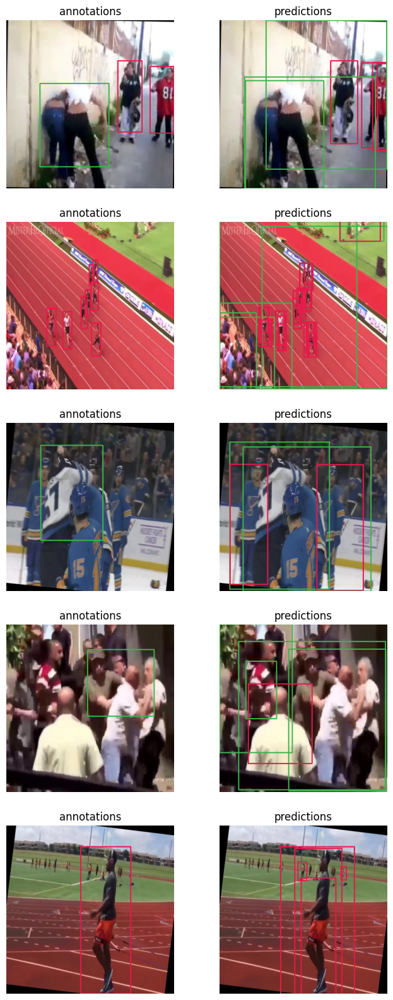

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 3.2 MB/s eta 0:00:00


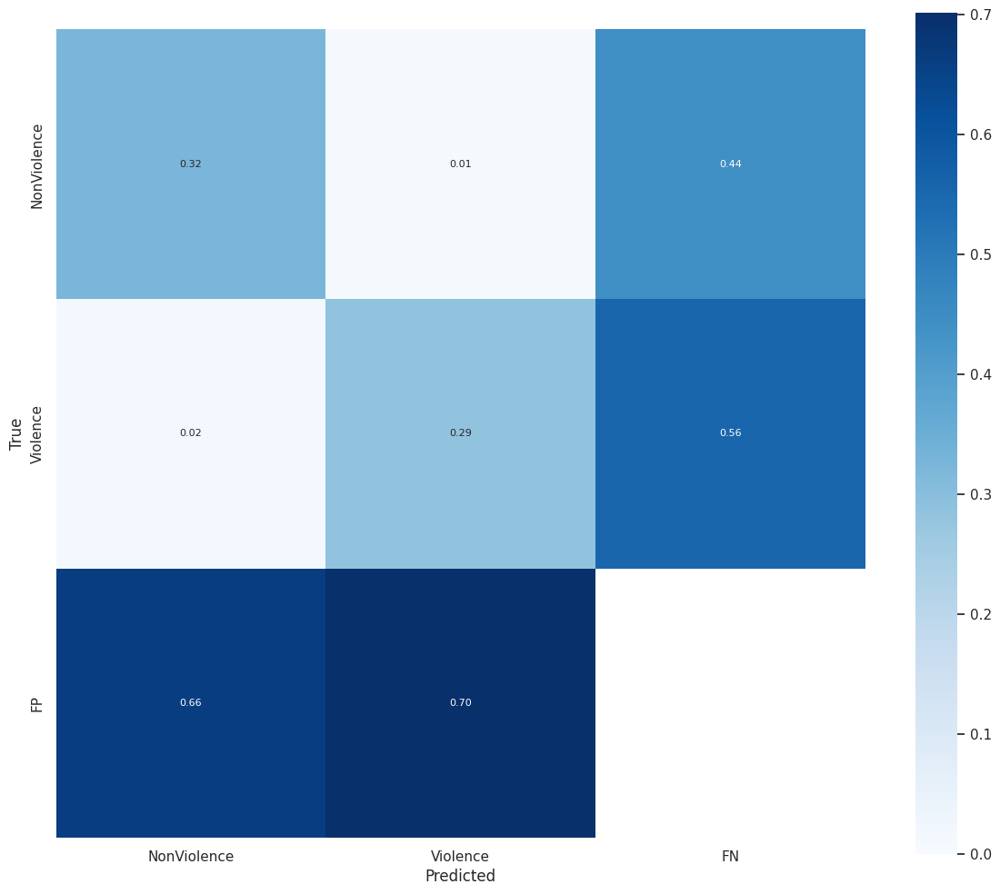

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join("/content", "confusion_matrix.png"), class_names=ds.classes)

### prediction on dataset (video)

In [ ]:
import torch
device = 0 if torch.cuda.is_available() else "cpu"

input_video_path = "/content/drive/MyDrive/thesis/dataset/mixed_videos/NV_1.mp4"
output_video_path = "/content/drive/MyDrive/thesis/YoloNas_output_videos/NV_1_yolonas.mp4"

best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 66/66 [00:02<00:00, 24.60it/s]


In [ ]:
import os
import torch

device = 0 if torch.cuda.is_available() else "cpu"

input_video_dir = "/content/drive/MyDrive/thesis/dataset/mixed_videos/"
output_video_dir = "/content/drive/MyDrive/thesis/YoloNas_output_videos/"
modelname = "yolo_nas_s"

# Assuming best_model is already defined and loaded

# List all files in the input video directory
input_files = os.listdir(input_video_dir)

for input_file in input_files:
    if input_file.endswith(".mp4"):
        input_video_path = os.path.join(input_video_dir, input_file)

        # Create the output video name with the format: original_video_name + "_YoloNas_s.mp4"
        output_video_name = os.path.splitext(input_file)[0] + "_" + modelname + ".mp4"
        output_video_path = os.path.join(output_video_dir, output_video_name)

        # Perform prediction and save the output video
        best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 114/114 [00:03<00:00, 31.78it/s]
